Matrix transpose

The T attribute is equivalent to calling transpose() when the rank is ≥2.

Matrix multiplication

Let's create two matrices and execute a matrix multiplication using the dot() method.

In [176]:
n1 = np.arange(10).reshape(2, 5)
n2 = np.arange(15).reshape(5,3)


In [177]:
# matrix Multiplication 
n1.dot(n2)

array([[ 90, 100, 110],
       [240, 275, 310]])

# NOTE: n1*n2 is not a matric multiplication, it is an elementwise product


In [179]:
# Many of the linear algebra functions are available in the numpy.linalg module
import numpy as np
import numpy.linalg as linalg

m3 = np.array([[1,2,3],[5,7,11],[21,29,31]])
m3

array([[ 1,  2,  3],
       [ 5,  7, 11],
       [21, 29, 31]])

Identity matrix
The product of a matrix by its inverse returns the identiy matrix (with small floating point errors):

In [180]:
m3.dot(linalg.inv(m3))

array([[ 1.00000000e+00, -5.55111512e-17,  0.00000000e+00],
       [-2.98372438e-16,  1.00000000e+00, -5.55111512e-17],
       [ 5.78009862e-15,  1.27675648e-15,  1.00000000e+00]])

# Solving a system of linear scalar equations

The `solve` function solves a system of linear scalar equations, such as:

* $2x + 6y = 6$
* $5x + 3y = -9$

In [182]:
coeffs  = np.array([[2, 6], [5, 3]])
depvars = np.array([6, -9])
solution = linalg.solve(coeffs, depvars)
#value of x = -3 & y = 2
solution

array([-3.,  2.])

In [184]:
# checking Solution i.e. putting values of X & Y into the equation
coeffs.dot(solution)

array([ 6., -9.])

## Norm
The norm of a vector $\textbf{u}$, noted $\left \Vert \textbf{u} \right \|$, is a measure of the length (a.k.a. the magnitude) of $\textbf{u}$.

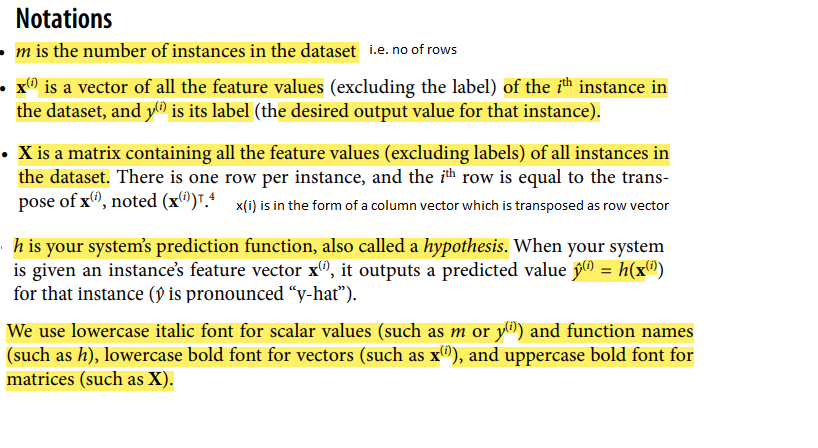

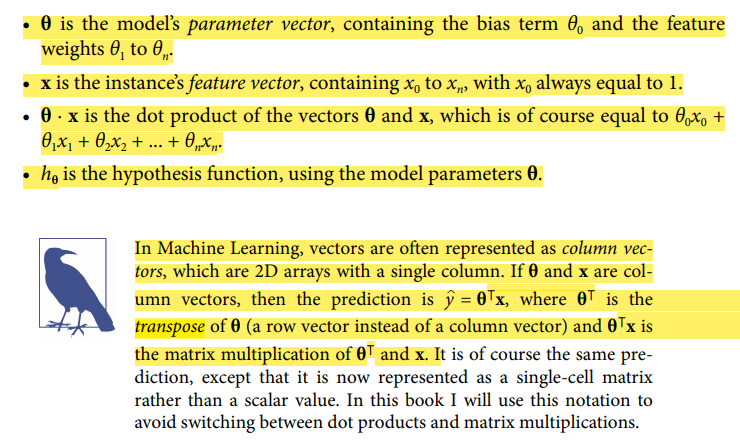

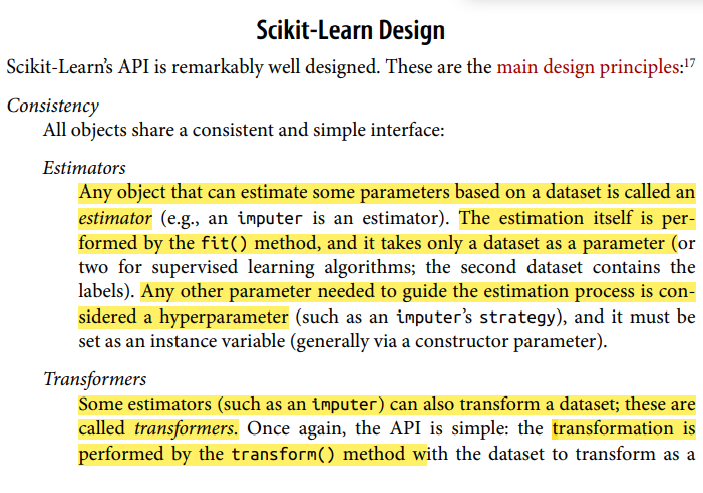

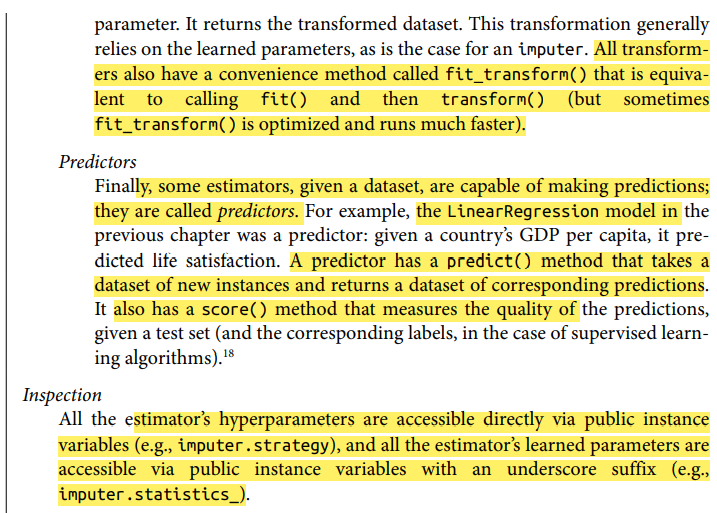

In [108]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "training_linear_models"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

In Machine Learning, vectors are often represented as column vectors, which are 2D arrays with a single column. If θ and x are column vectors, then the prediction is y = (θT)x, where θT is the transpose of θ (a row vector instead of a column vector) and (θT)x is the matrix multiplication of θT and x.

Therefore, to train a Linear Regression model, we need to find the value of θ that minimizes the RMSE. In practice, it is simpler to minimize the mean squared error (MSE) than the RMSE, and it leads to the same result. 

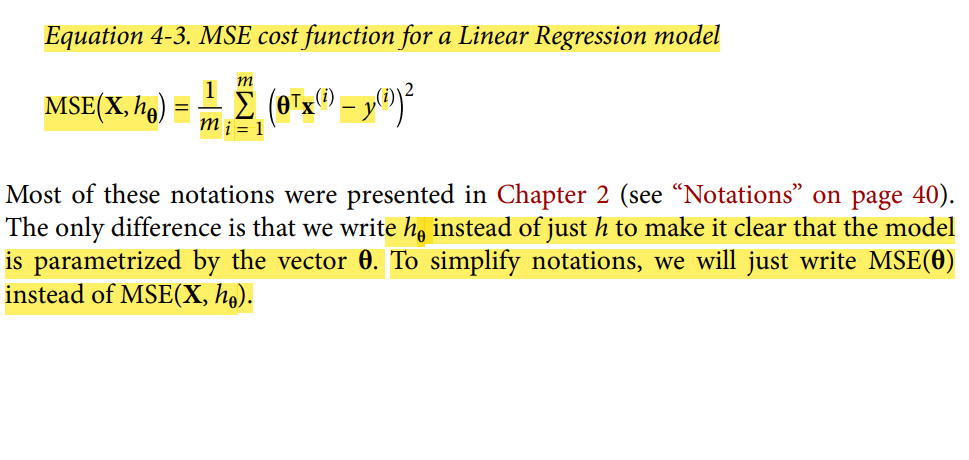

# Normal Equation in Linear Regression

Normal Equation is an analytical approach to Linear Regression with a Least Square Cost Function. We can directly find out the value of θ without using Gradient Descent. Following this approach is an effective and a time-saving option when are working with a dataset with small features.

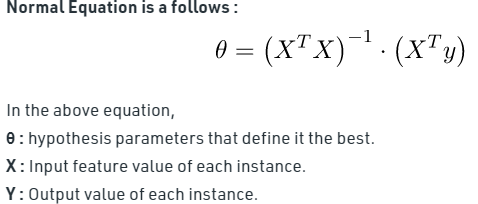

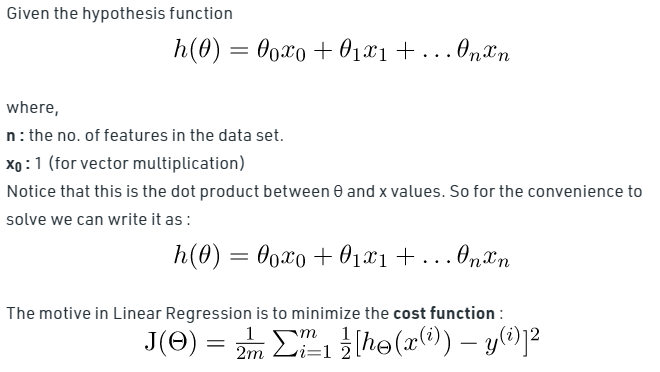

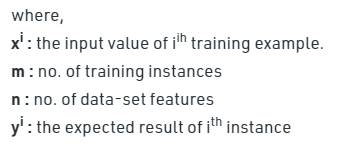

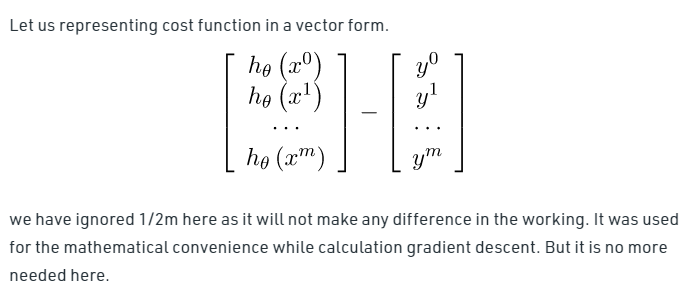 

For matrix multiplication we transpose the 0 column vector into a row matrix i.e. '0T'

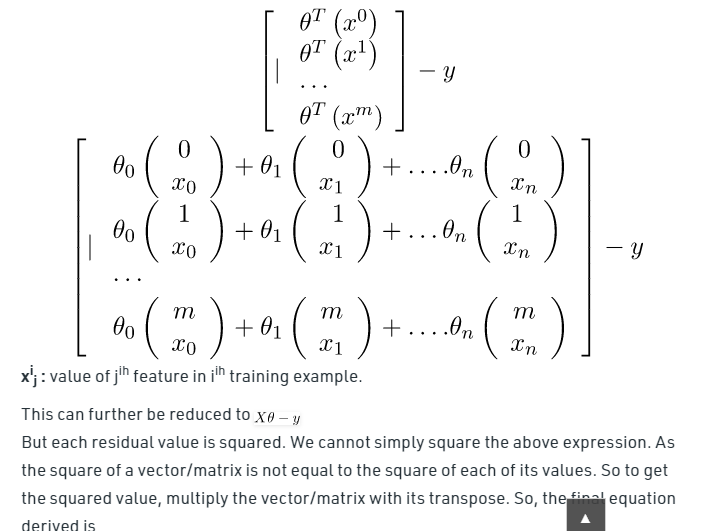

For A**2 of a matrix A = AT*A, where AT is the transpose of the matrix A which is done below 

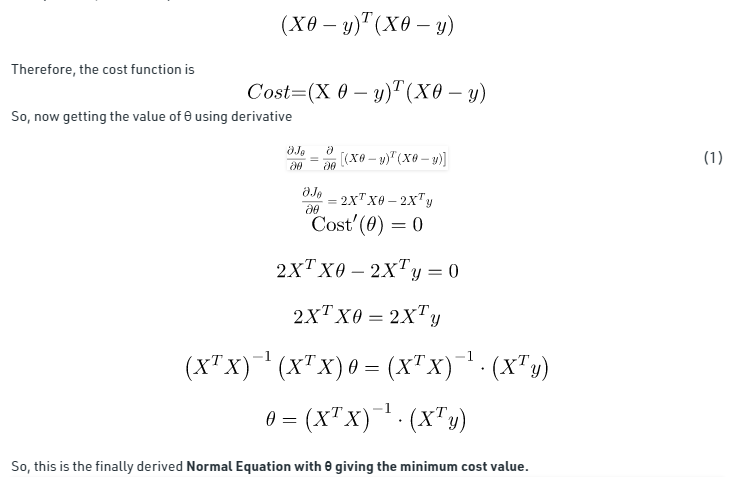

# Linear regression using the Normal Equation

In [109]:
import numpy as np

X = 2 * np.random.rand(100, 1)

# y = 4 + 3*x + Gaussian noise which is shown below 
y = 4 + 3 * X + np.random.randn(100, 1)

In [110]:
# X is a column vector of 100 X 1 In this book all vectors are represented as column vector. 
X.shape

(100, 1)

In [111]:
X.ndim

2

Saving figure generated_data_plot


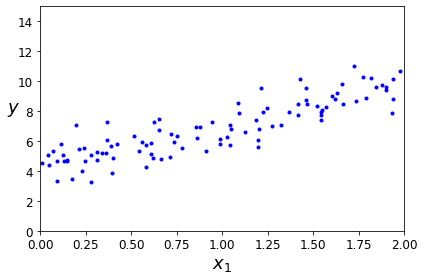

In [112]:
plt.plot(X, y, "b.")
plt.xlabel("$x_1$", fontsize=18)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.axis([0, 2, 0, 15])
save_fig("generated_data_plot")
plt.show()

In [113]:
# preparing the data for vector multiplication i.e. adding x0 = 1 column in X using np.c_

X_b = np.c_[np.ones((100, 1)), X] 
X_b[:5,:]

array([[1.        , 0.74908024],
       [1.        , 1.90142861],
       [1.        , 1.46398788],
       [1.        , 1.19731697],
       [1.        , 0.31203728]])

In [114]:
# calculating the normal function 
theta_best = np.linalg.inv(X_b.T.dot(X_b)).dot(X_b.T).dot(y)

In [115]:
# for the equation  y = 4 + 3*x + Gaussian noise lets find the best value for 01 i.e. 4 and 02 i.e.3 which is 4.2 and 2.77
theta_best

array([[4.21509616],
       [2.77011339]])

In [116]:
#Making Preduction using updated equation --> y = 4.2 + 2.77x
# test data 
X_new = np.array([[0], [2]])
X_new_b = np.c_[np.ones((2, 1)), X_new]  # add x0 = 1 to each instance
X_new_b


array([[1., 0.],
       [1., 2.]])

In [117]:
y_predict = X_new_b.dot(theta_best)
y_predict

array([[4.21509616],
       [9.75532293]])

Saving figure linear_model_predictions_plot


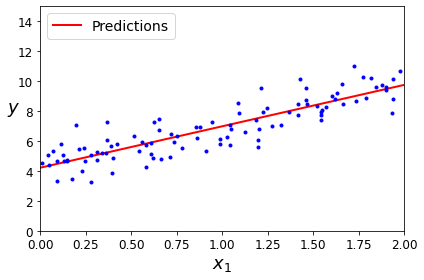

In [118]:
plt.plot(X_new, y_predict, "r-", linewidth=2, label="Predictions")
plt.plot(X, y, "b.")
plt.xlabel("$x_1$", fontsize=18)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.legend(loc="upper left", fontsize=14)
plt.axis([0, 2, 0, 15])
save_fig("linear_model_predictions_plot")
plt.show()

# Performing Linear Regression using Scikit-Learn is simple:

In [119]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(X, y)
lin_reg.intercept_, lin_reg.coef_
#  y = 01 + 02*x
# 01 = 4.21 & 02 = 2.77


(array([4.21509616]), array([[2.77011339]]))

In [120]:
# y_predict 
lin_reg.predict(X_new)

array([[4.21509616],
       [9.75532293]])

# Alternatively Use Least Square Method Directly 
The LinearRegression class is based on the scipy.linalg.lstsq() function (the name stands for "least squares"), which you could call directly:

In [121]:
# it gives the same values as above 
#  y = 01 + 02*x
# 01 = 4.21 & 02 = 2.77
theta_best_svd, residuals, rank, s = np.linalg.lstsq(X_b, y, rcond=1e-6)
theta_best_svd

array([[4.21509616],
       [2.77011339]])

# Singular Value Decompisition 

In [1]:
from IPython.display import HTML
video_path = 'videoplayback.mp4'

HTML("""
<video width="840" height="460" controls="">
<source src="{0}">
</video>
""".format(video_path))

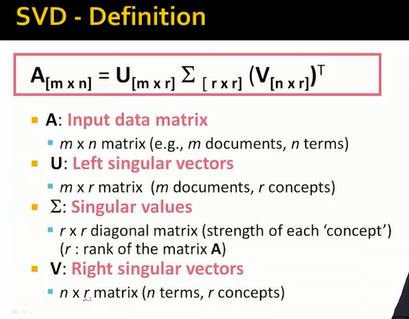

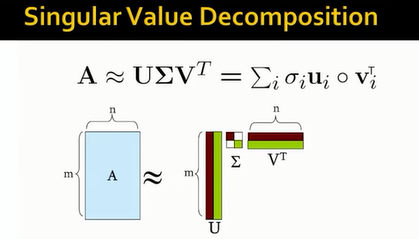

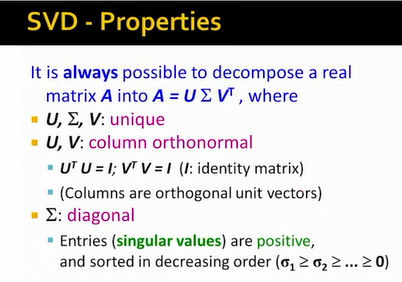

# PSEUDO INVERSE

The above function computes $\mathbf{X}^+\mathbf{y}$, where $\mathbf{X}^{+}$ is the _pseudoinverse_ of $\mathbf{X}$ (specifically the Moore-Penrose inverse). You can use `np.linalg.pinv()` to compute the pseudoinverse directly:

In [123]:
Pseudo = np.linalg.pinv(X_b)
Pseudo

array([[ 0.0151325 , -0.01578757, -0.00405006,  0.00310531,  0.02685933,
         0.02686063,  0.03211496, -0.01125087,  0.00297349, -0.00276633,
         0.03412733, -0.01681768, -0.00944058,  0.02383693,  0.02547445,
         0.02538969,  0.018905  ,  0.00707123,  0.0120519 ,  0.01960334,
         0.00239724,  0.02774613,  0.01955421,  0.01557138,  0.01075725,
        -0.00690404,  0.02451661,  0.00763588,  0.00344039,  0.03273925,
         0.00262843,  0.02608091,  0.03174103, -0.01568943, -0.01658812,
        -0.00815021,  0.01888506,  0.02999047, -0.001487  ,  0.01161145,
         0.02868287,  0.00865859,  0.03338655, -0.01356618,  0.0213447 ,
        -0.0003219 ,  0.01850419,  0.00732283,  0.00589309,  0.02531188,
        -0.01680023, -0.00636508, -0.0151857 , -0.01278842,  0.00314602,
        -0.01423988,  0.03048309,  0.02471468,  0.03280489,  0.01777332,
         0.01437384,  0.02067019, -0.00924175,  0.01608702,  0.02015579,
         0.0061085 ,  0.02766937, -0.00781747,  0.0

In [124]:
Pseudo.dot(y)

array([[4.21509616],
       [2.77011339]])

# Limitation of SVD and Normal Function

Normal Equation and the SVD approach get very slow when the number of features grows large (e.g., 100,000).

# Gradient Descent
Now we will look at a very different way to train a Linear Regression model, which is better suited for cases where there are a large number of features or too many training instances to fit in memory.

In [125]:
from IPython.display import HTML
video_path = '4. Gradient Decent explained Part 1 (1).mp4'

HTML("""
<video width="840" height="460" controls="">
<source src="{0}">
</video>
""".format(video_path))

In [126]:
from IPython.display import HTML
video_path = '5. Gradient Decent explained Part 2.mp4'

HTML("""
<video width="840" height="460" controls="">
<source src="{0}">
</video>
""".format(video_path))

In [127]:
from IPython.display import HTML
video_path = '6. Gradient Decent for linear Regression.mp4'

HTML("""
<video width="840" height="460" controls="">
<source src="{0}">
</video>
""".format(video_path))

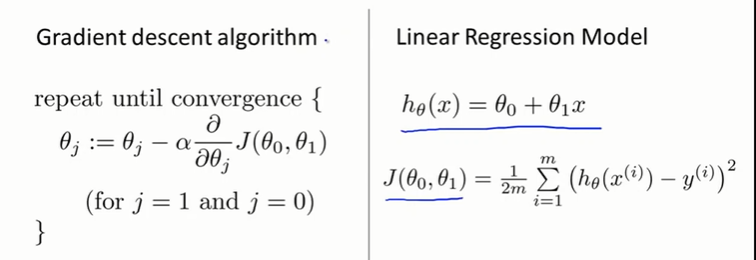

Concretely, you start by filling θ with random values (this is called random initialization). Then you improve it gradually, taking one baby step at a time, each step attempting to decrease the cost function (e.g., the MSE), until the algorithm converges to a minimum (see Figure 4-3).

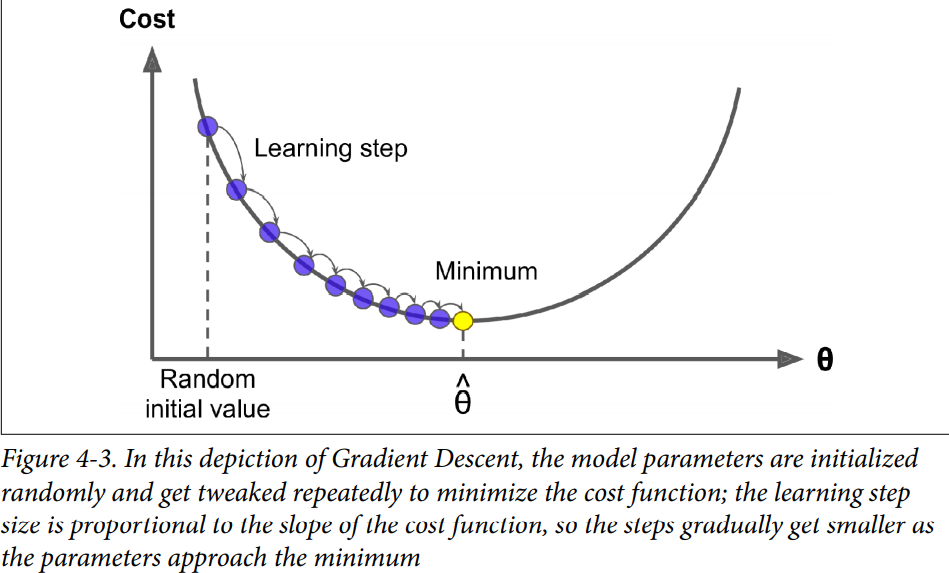

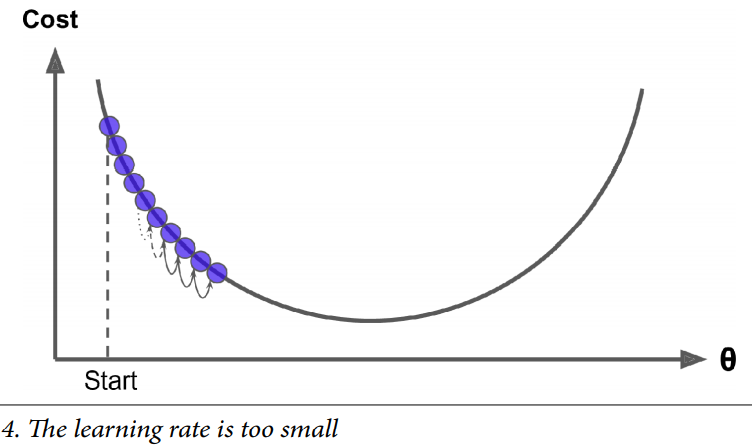

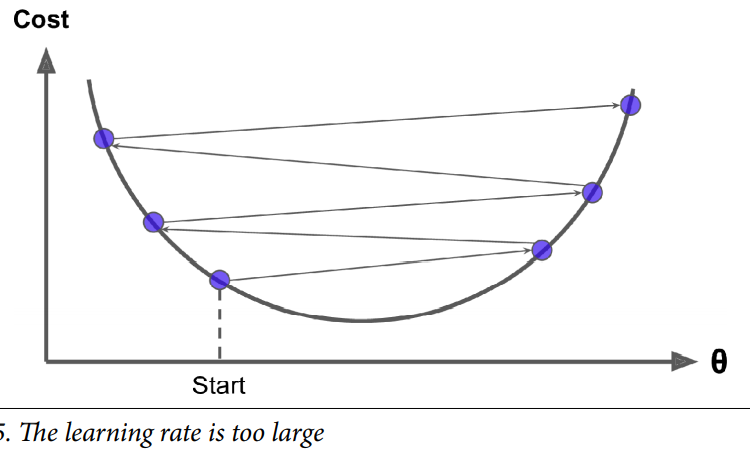

# Batch Gradient Descent

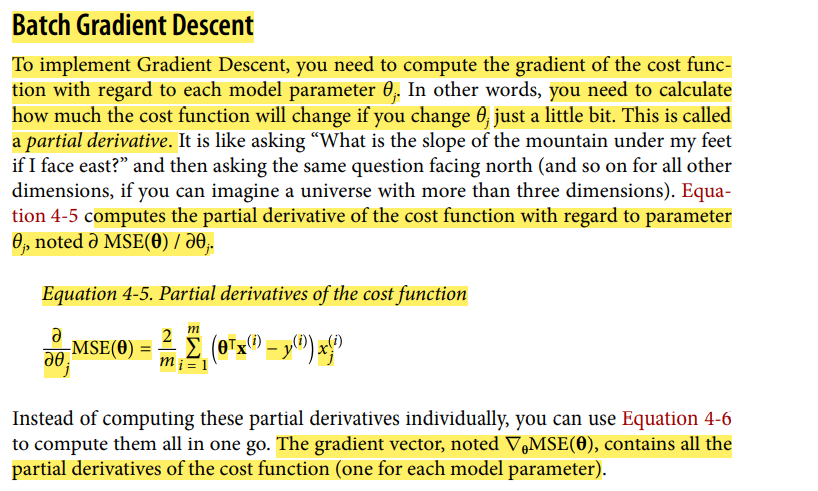

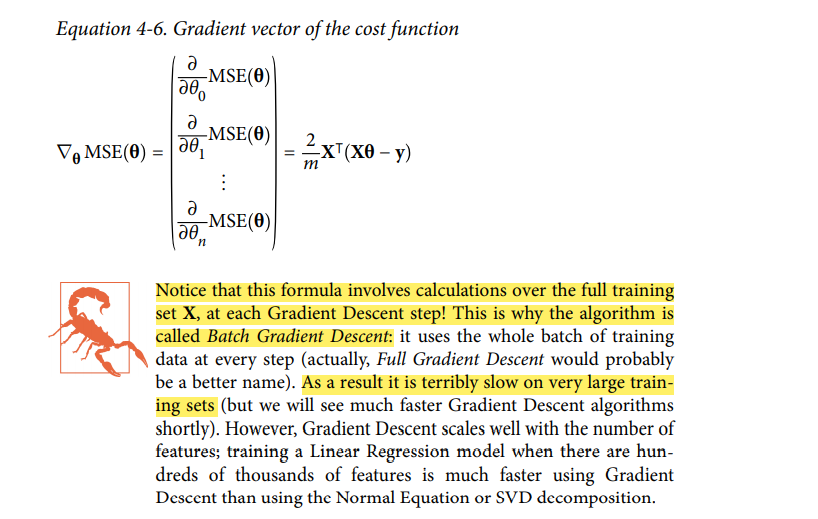

Once you have the gradient vector, which points uphill, just go in the opposite direction to go downhill. This means subtracting ∇θMSE(θ) from θ. This is where the learning rate η comes into play:multiply the gradient vector by η to determine the size of the downhill step 

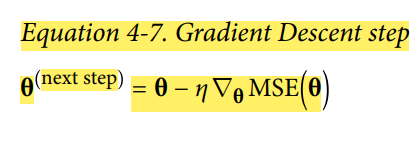


In [128]:
X_b.shape

(100, 2)

In [129]:
# Calculating gradient decent 
eta = 0.1  # learning rate
n_iterations = 1000 # no of steps 
m = 100 # no of instances or rows 

theta = np.random.randn(2,1)  # random initialization
print(theta)

for iteration in range(n_iterations):
    # see equation 4.6 
    gradients = 2/m * X_b.T.dot(X_b.dot(theta) - y)
    theta = theta - eta * gradients
    print(theta)

[[0.01300189]
 [1.45353408]]
[[1.10103284]
 [2.5689581 ]]
[[1.76167724]
 [3.20430202]]
[[2.17070217]
 [3.55850018]]
[[2.43130725]
 [3.74830359]]
[[2.60409456]
 [3.84222284]]
[[2.72466079]
 [3.88045243]]
[[2.81392385]
 [3.88656613]]
[[2.88418448]
 [3.87438216]]
[[2.94268445]
 [3.85199292]]
[[2.99369522]
 [3.82413043]]
[[3.039744  ]
 [3.79355481]]
[[3.08233345]
 [3.76186927]]
[[3.12236419]
 [3.72999852]]
[[3.16038278]
 [3.69846951]]
[[3.19672739]
 [3.66757628]]
[[3.23161323]
 [3.63747665]]
[[3.26518282]
 [3.608249  ]]
[[3.29753539]
 [3.57992555]]
[[3.32874431]
 [3.5525119 ]]
[[3.3588672 ]
 [3.52599845]]
[[3.38795195]
 [3.50036716]]
[[3.41604028]
 [3.47559544]]
[[3.44316983]
 [3.4516584 ]]
[[3.46937536]
 [3.42853024]]
[[3.49468955]
 [3.406185  ]]
[[3.51914342]
 [3.38459697]]
[[3.54276663]
 [3.36374097]]
[[3.56558763]
 [3.34359244]]
[[3.58763381]
 [3.32412755]]
[[3.60893156]
 [3.3053232 ]]
[[3.62950634]
 [3.28715702]]
[[3.64938272]
 [3.2696074 ]]
[[3.66858442]
 [3.25265343]]
[[3.68713436]


[[4.21509165]
 [2.77011736]]
[[4.21509181]
 [2.77011723]]
[[4.21509195]
 [2.7701171 ]]
[[4.2150921 ]
 [2.77011697]]
[[4.21509223]
 [2.77011685]]
[[4.21509237]
 [2.77011673]]
[[4.2150925 ]
 [2.77011662]]
[[4.21509262]
 [2.77011651]]
[[4.21509274]
 [2.7701164 ]]
[[4.21509286]
 [2.7701163 ]]
[[4.21509297]
 [2.7701162 ]]
[[4.21509308]
 [2.77011611]]
[[4.21509318]
 [2.77011601]]
[[4.21509328]
 [2.77011593]]
[[4.21509338]
 [2.77011584]]
[[4.21509347]
 [2.77011576]]
[[4.21509357]
 [2.77011568]]
[[4.21509365]
 [2.7701156 ]]
[[4.21509374]
 [2.77011552]]
[[4.21509382]
 [2.77011545]]
[[4.2150939 ]
 [2.77011538]]
[[4.21509398]
 [2.77011531]]
[[4.21509405]
 [2.77011525]]
[[4.21509412]
 [2.77011518]]
[[4.21509419]
 [2.77011512]]
[[4.21509426]
 [2.77011506]]
[[4.21509432]
 [2.77011501]]
[[4.21509438]
 [2.77011495]]
[[4.21509444]
 [2.7701149 ]]
[[4.2150945 ]
 [2.77011485]]
[[4.21509456]
 [2.7701148 ]]
[[4.21509461]
 [2.77011475]]
[[4.21509467]
 [2.7701147 ]]
[[4.21509472]
 [2.77011466]]
[[4.21509477]


[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]
 [2.77011339]]
[[4.21509616]


In [130]:
# Getting the 0 values 
#  y = 01 + 02*x
# 01 = 4.21 & 02 = 2.77
theta

array([[4.21509616],
       [2.77011339]])

In [131]:
# predicting Y values y = X*0
X_new_b.dot(theta)

array([[4.21509616],
       [9.75532293]])

 Shows the first 10 steps of Gradient Descent using three different learning rates (the dashed line
represents the starting point).

In [132]:
theta_path_bgd = []

def plot_gradient_descent(theta, eta, theta_path=None):
    m = len(X_b)
    plt.plot(X, y, "b.")
    n_iterations = 1000
    for iteration in range(n_iterations):
        if iteration < 10:
            y_predict = X_new_b.dot(theta)
            style = "b-" if iteration > 0 else "r--"
            plt.plot(X_new, y_predict, style)
        gradients = 2/m * X_b.T.dot(X_b.dot(theta) - y)
        theta = theta - eta * gradients
        if theta_path is not None:
            theta_path.append(theta)
    plt.xlabel("$x_1$", fontsize=18)
    plt.axis([0, 2, 0, 15])
    plt.title(r"$\eta = {}$".format(eta), fontsize=16)

Saving figure gradient_descent_plot


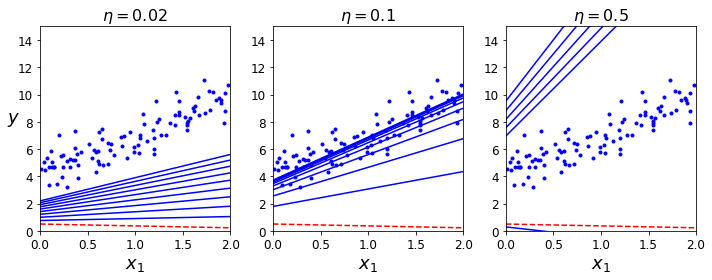

In [133]:
# 

np.random.seed(42)
theta = np.random.randn(2,1)  # random initialization

plt.figure(figsize=(10,4))
plt.subplot(131); plot_gradient_descent(theta, eta=0.02)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.subplot(132); plot_gradient_descent(theta, eta=0.1, theta_path=theta_path_bgd)
plt.subplot(133); plot_gradient_descent(theta, eta=0.5)

save_fig("gradient_descent_plot")
plt.show()

# Stochastic Gradient Descent

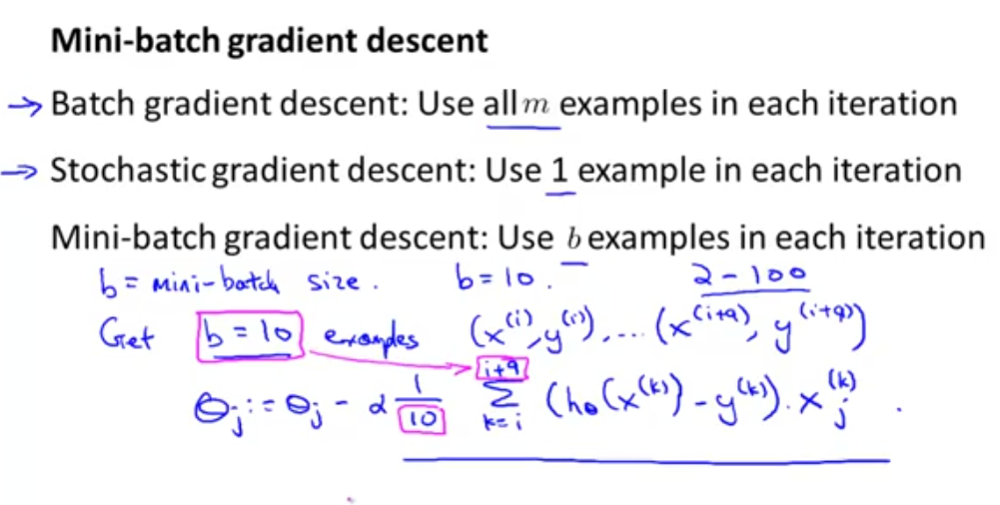

In [134]:
from IPython.display import HTML
video_path = '10.2 Stochastic Gradient Descent.mp4'

HTML("""
<video width="840" height="460" controls="">
<source src="{0}">
</video>
""".format(video_path))

In [135]:
from IPython.display import HTML
video_path = '10.4 Stochastic Gradient Descent Convergence.mp4'

HTML("""
<video width="840" height="460" controls="">
<source src="{0}">
</video>
""".format(video_path))

The main problem with Batch Gradient Descent is the fact that it uses the whole training set to compute the gradients at every step, which makes it very slow when the training set is large. At the opposite extreme, Stochastic Gradient Descent picks a
random instance in the training set at every step and computes the gradients based only on that single instance. 

Stochastic GD can be implemented as an out-of-core algorithm.

Unlike batch GD, stochastic GD doesn't decrease unformly but the cost function will bounce up and down, decreasing only on aver
age. Over time it will end up very close to the minimum, but once it gets there it will continue to bounce around, never settling down (see Figure 4-9). So once the algorithm stops, the final parameter values are good, but not optimal.

The algorithm can never settle at the minimum. One solution to this dilemma is to gradually reduce the learning rate. The function that determines the learning rate at each iteration is called the learning schedule.

This code implements Stochastic Gradient Descent using a simple learning schedule:

In [136]:
theta_path_sgd = []
m = len(X_b)
np.random.seed(42)

Saving figure sgd_plot


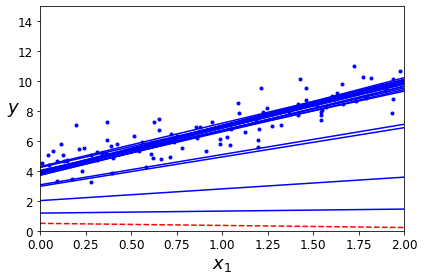

In [137]:
n_epochs = 50
t0, t1 = 5, 50  # learning schedule hyperparameters

def learning_schedule(t):
    return t0 / (t + t1)

theta = np.random.randn(2,1)  # random initialization

for epoch in range(n_epochs):
    for i in range(m):
        if epoch == 0 and i < 20:                    # not shown in the book
            y_predict = X_new_b.dot(theta)           # not shown
            style = "b-" if i > 0 else "r--"         # not shown
            plt.plot(X_new, y_predict, style)        # not shown
        random_index = np.random.randint(m)
        xi = X_b[random_index:random_index+1]
        yi = y[random_index:random_index+1]
        gradients = 2 * xi.T.dot(xi.dot(theta) - yi)
        eta = learning_schedule(epoch * m + i)
        theta = theta - eta * gradients
        theta_path_sgd.append(theta)                 # not shown

plt.plot(X, y, "b.")                                 # not shown
plt.xlabel("$x_1$", fontsize=18)                     # not shown
plt.ylabel("$y$", rotation=0, fontsize=18)           # not shown
plt.axis([0, 2, 0, 15])                              # not shown
save_fig("sgd_plot")                                 # not shown
plt.show()                                           # not shown

In [138]:
from sklearn.linear_model import SGDRegressor

sgd_reg = SGDRegressor(max_iter=1000, tol=1e-3, penalty=None, eta0=0.1, random_state=42)
sgd_reg.fit(X, y.ravel())

SGDRegressor(eta0=0.1, penalty=None, random_state=42)

In [139]:
sgd_reg.intercept_, sgd_reg.coef_

(array([4.24365286]), array([2.8250878]))

# Mini-batch gradient descent

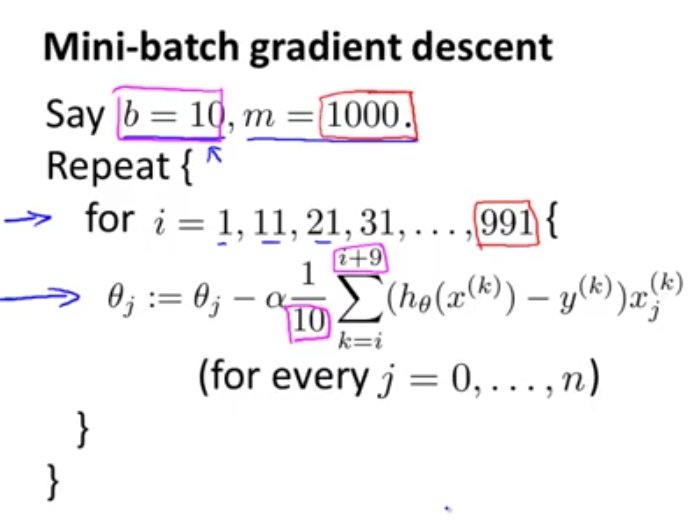

In [140]:
from IPython.display import HTML
video_path = '10.3 Mini-Batch Gradient Descent.mp4'

HTML("""
<video width="840" height="460" controls="">
<source src="{0}">
</video>
""".format(video_path))

In [141]:
theta_path_mgd = []

n_iterations = 50
minibatch_size = 20

np.random.seed(42)
theta = np.random.randn(2,1)  # random initialization

t0, t1 = 200, 1000
def learning_schedule(t):
    return t0 / (t + t1)

t = 0
for epoch in range(n_iterations):
    shuffled_indices = np.random.permutation(m)
    X_b_shuffled = X_b[shuffled_indices]
    y_shuffled = y[shuffled_indices]
    for i in range(0, m, minibatch_size):
        t += 1
        xi = X_b_shuffled[i:i+minibatch_size]
        yi = y_shuffled[i:i+minibatch_size]
        gradients = 2/minibatch_size * xi.T.dot(xi.dot(theta) - yi)
        eta = learning_schedule(t)
        theta = theta - eta * gradients
        theta_path_mgd.append(theta)

In [142]:
theta

array([[4.25214635],
       [2.7896408 ]])

# Comparing three types of GDs 

In [143]:
theta_path_bgd = np.array(theta_path_bgd)
theta_path_sgd = np.array(theta_path_sgd)
theta_path_mgd = np.array(theta_path_mgd)

Saving figure gradient_descent_paths_plot


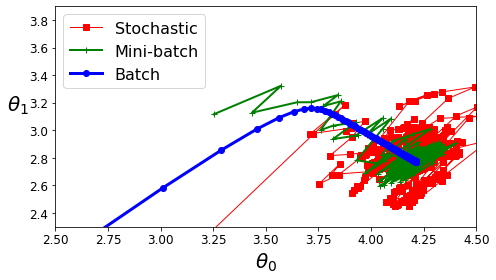

In [144]:
plt.figure(figsize=(7,4))
plt.plot(theta_path_sgd[:, 0], theta_path_sgd[:, 1], "r-s", linewidth=1, label="Stochastic")
plt.plot(theta_path_mgd[:, 0], theta_path_mgd[:, 1], "g-+", linewidth=2, label="Mini-batch")
plt.plot(theta_path_bgd[:, 0], theta_path_bgd[:, 1], "b-o", linewidth=3, label="Batch")
plt.legend(loc="upper left", fontsize=16)
plt.xlabel(r"$\theta_0$", fontsize=20)
plt.ylabel(r"$\theta_1$   ", fontsize=20, rotation=0)
plt.axis([2.5, 4.5, 2.3, 3.9])
save_fig("gradient_descent_paths_plot")
plt.show()

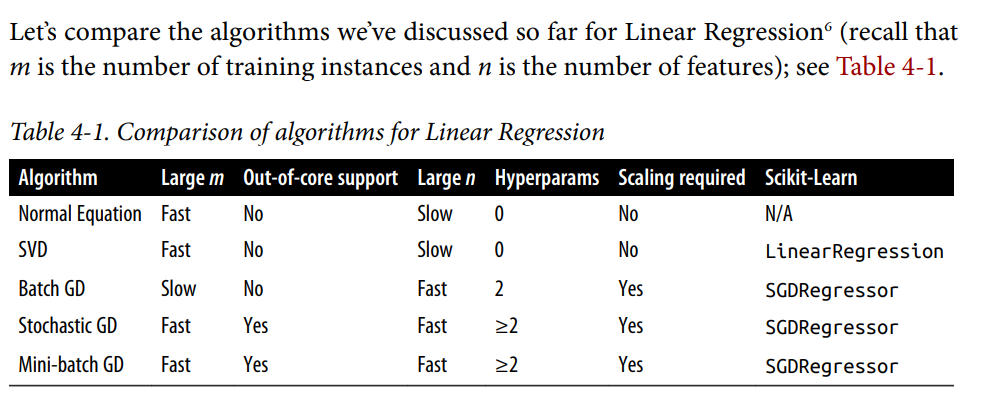

# Polynomial Regression

In [145]:
import numpy as np
import numpy.random as rnd

np.random.seed(42)

# Creating X and Y values 

In [146]:
# defining X values 
m = 100
X = 6 * np.random.rand(m, 1) - 3
X[:5,:]

array([[-0.75275929],
       [ 2.70428584],
       [ 1.39196365],
       [ 0.59195091],
       [-2.06388816]])

In [147]:
# Getting the y value 
# A quadratic equation is of the form y = ax2 + bx + c.

# Defining the polynomial equation y = 0.5(X)**2 + X + noise 

y = 0.5 * X**2 + X + 2 + np.random.randn(m, 1)

y[:5,:]

array([[1.61761105],
       [8.06185944],
       [4.45250583],
       [0.77958493],
       [1.84625712]])

Saving figure quadratic_data_plot


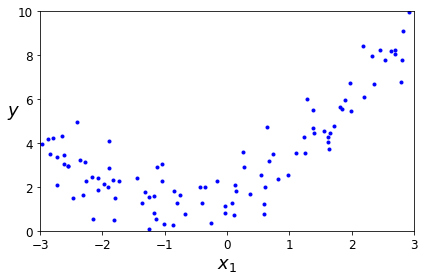

In [148]:
plt.plot(X, y, "b.")
plt.xlabel("$x_1$", fontsize=18)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.axis([-3, 3, 0, 10])
save_fig("quadratic_data_plot")
plt.show()

# Using Scikit Learn's Polynomial function 

In [149]:
# Data Preprocessing 
from sklearn.preprocessing import PolynomialFeatures
poly_features = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly_features.fit_transform(X)
X[0]

array([-0.75275929])

In [150]:
# geting the x_poly ( i.e. x, X**2) values for 0 row 
X_poly[0]

array([-0.75275929,  0.56664654])

In [151]:
X[0]**2

array([0.56664654])

In [152]:
#fitting and transforming 

lin_reg = LinearRegression()
lin_reg.fit(X_poly, y)
lin_reg.intercept_, lin_reg.coef_

# The equation is 0.56(x)**2 + 0.93X + 1.78

(array([1.78134581]), array([[0.93366893, 0.56456263]]))

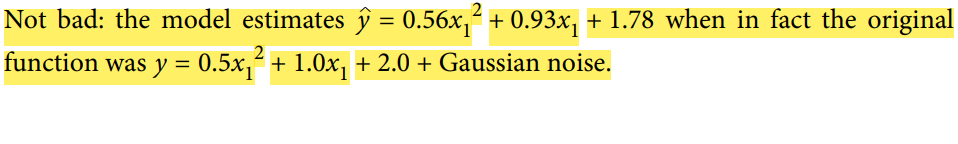

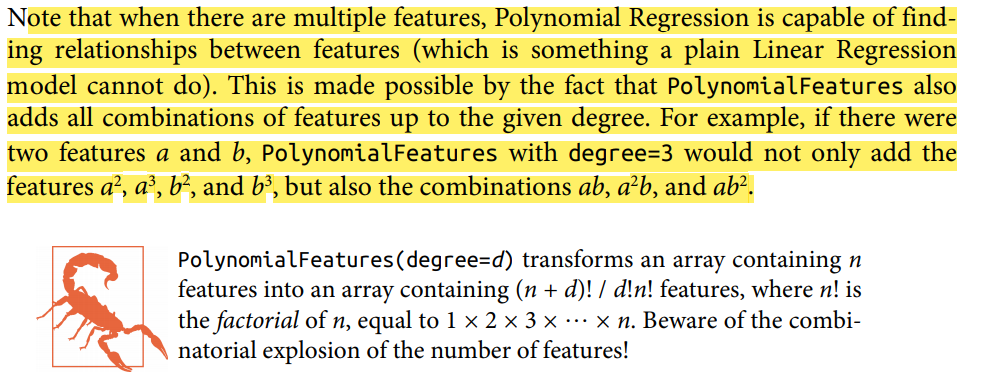

# Learning Curves


In [153]:
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

def plot_learning_curves(model, X, y):
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=10)
    train_errors, val_errors = [], []
    for m in range(1, len(X_train)):
        model.fit(X_train[:m], y_train[:m])
        y_train_predict = model.predict(X_train[:m])
        y_val_predict = model.predict(X_val)
        train_errors.append(mean_squared_error(y_train[:m], y_train_predict))
        val_errors.append(mean_squared_error(y_val, y_val_predict))

    plt.plot(np.sqrt(train_errors), "r-+", linewidth=2, label="train")
    plt.plot(np.sqrt(val_errors), "b-", linewidth=3, label="val")
    plt.legend(loc="upper right", fontsize=14)   # not shown in the book
    plt.xlabel("Training set size", fontsize=14) # not shown
    plt.ylabel("RMSE", fontsize=14)              # not shown

Saving figure underfitting_learning_curves_plot


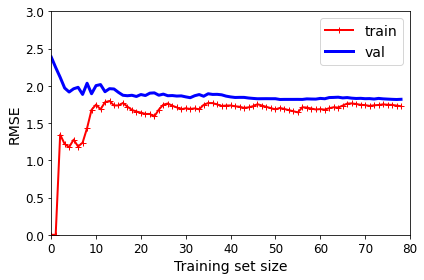

In [154]:
lin_reg = LinearRegression()
plot_learning_curves(lin_reg, X, y)
plt.axis([0, 80, 0, 3])                         # not shown in the book
save_fig("underfitting_learning_curves_plot")   # not shown
plt.show()                                      # not shown

Saving figure learning_curves_plot


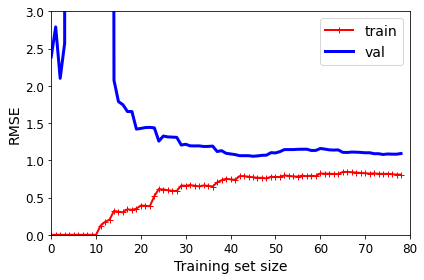

In [155]:
from sklearn.pipeline import Pipeline

polynomial_regression = Pipeline([
        ("poly_features", PolynomialFeatures(degree=10, include_bias=False)),
        ("lin_reg", LinearRegression()),
    ])

plot_learning_curves(polynomial_regression, X, y)
plt.axis([0, 80, 0, 3])           # not shown
save_fig("learning_curves_plot")  # not shown
plt.show()                        # not shown

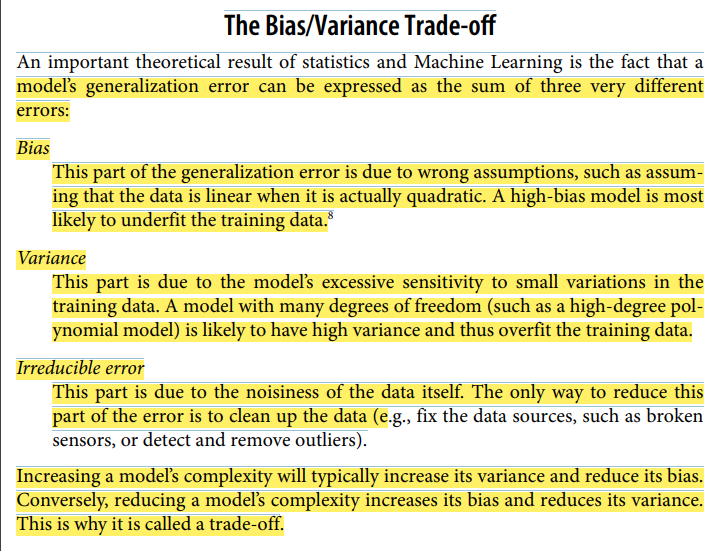

# Logistics Regression 

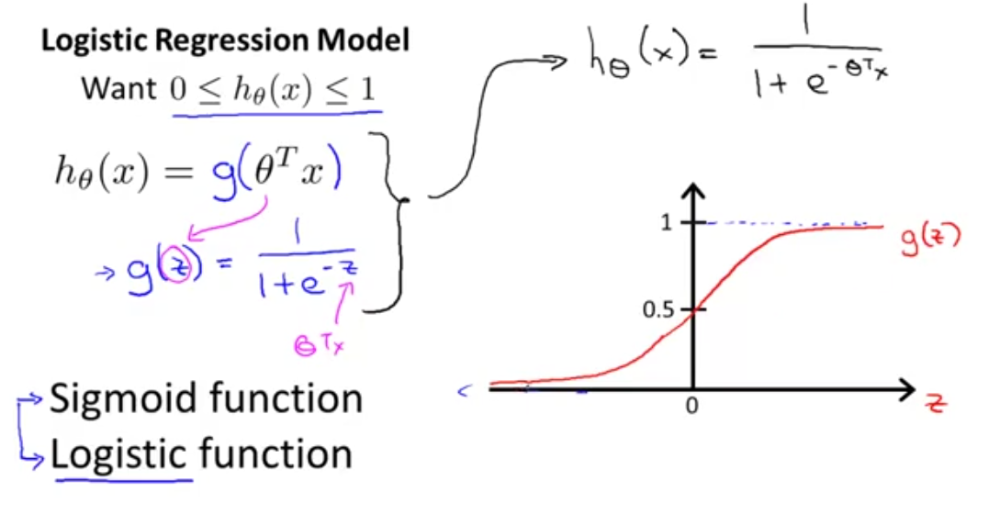

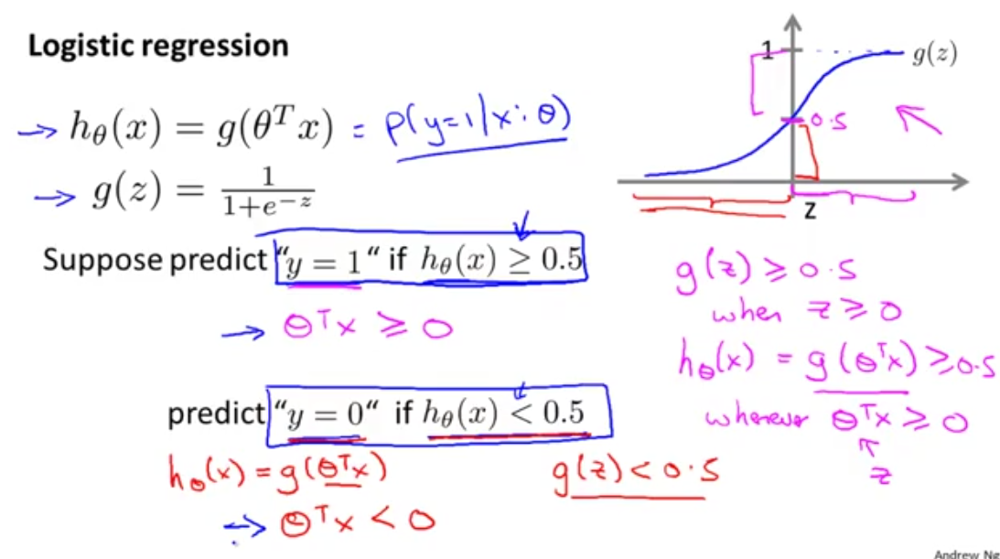

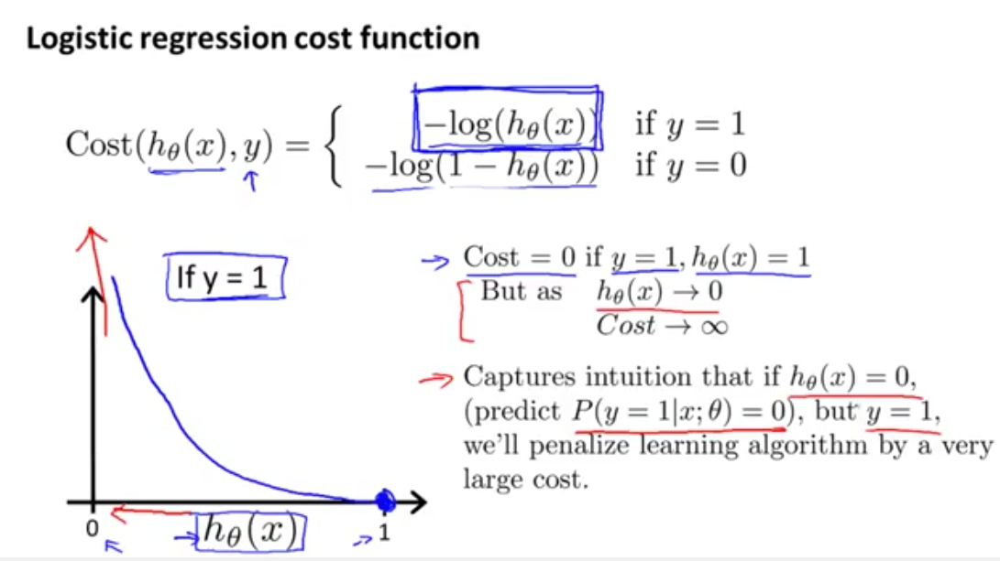

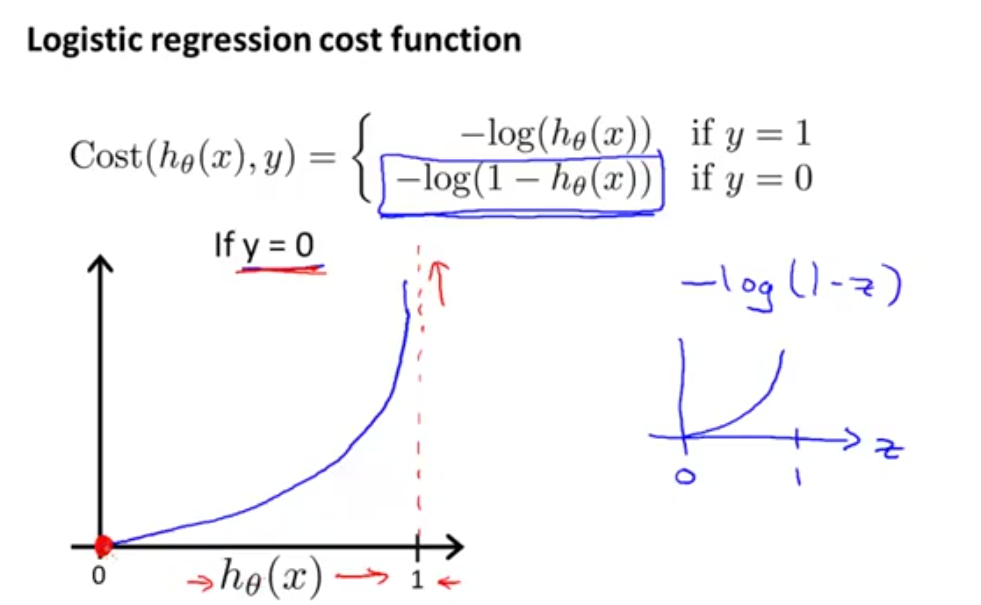

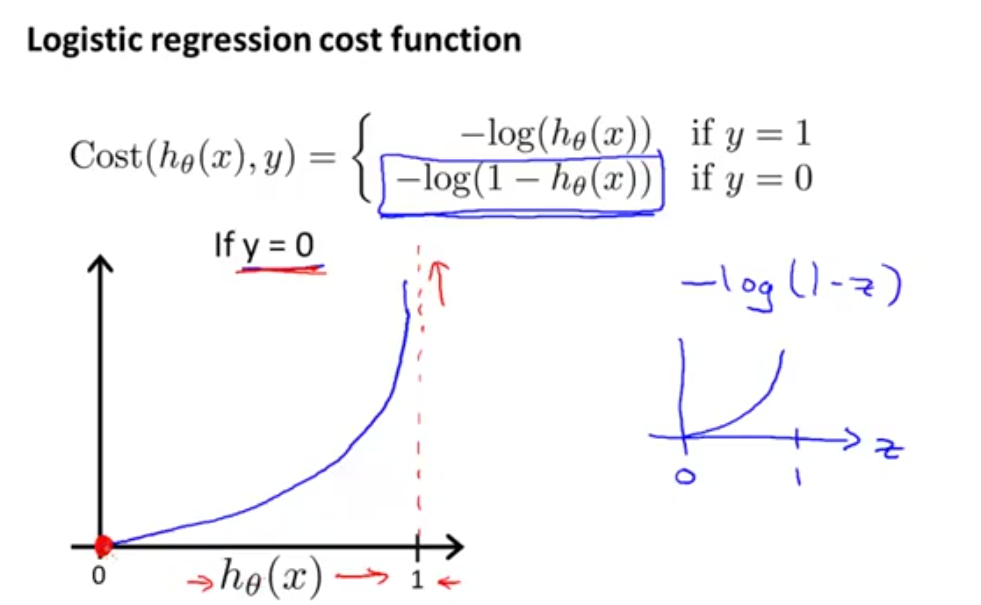

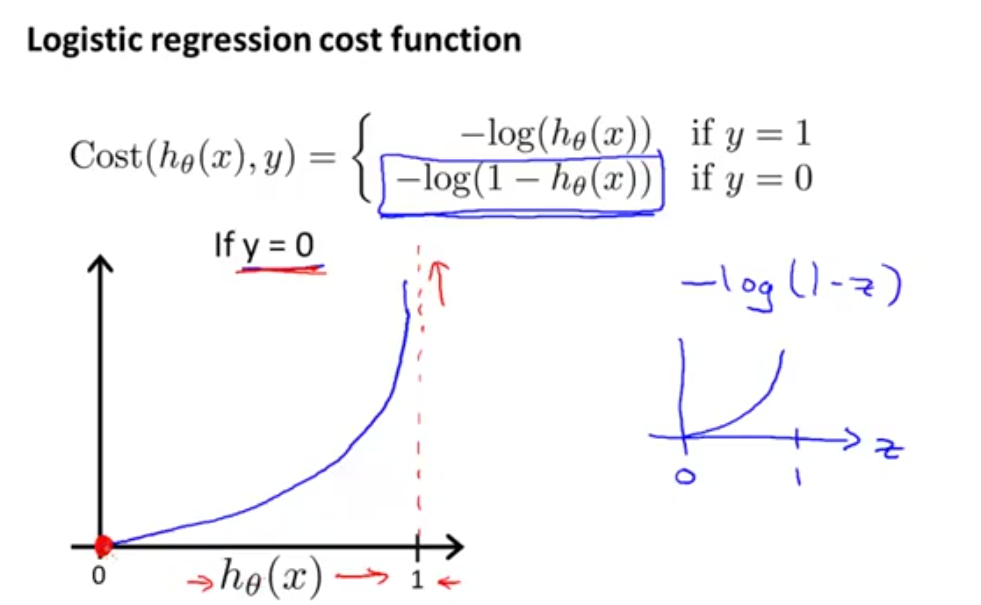

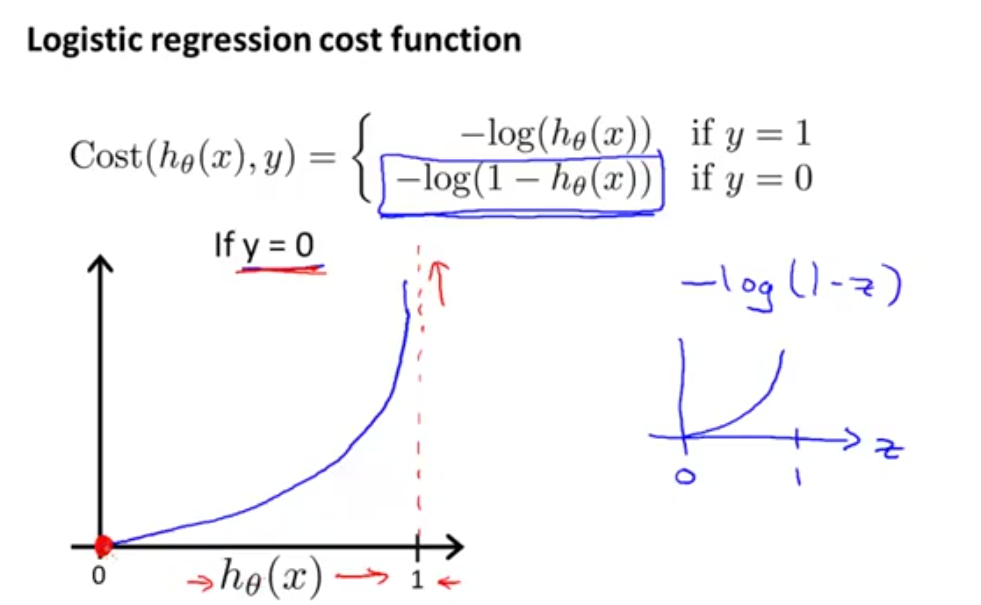

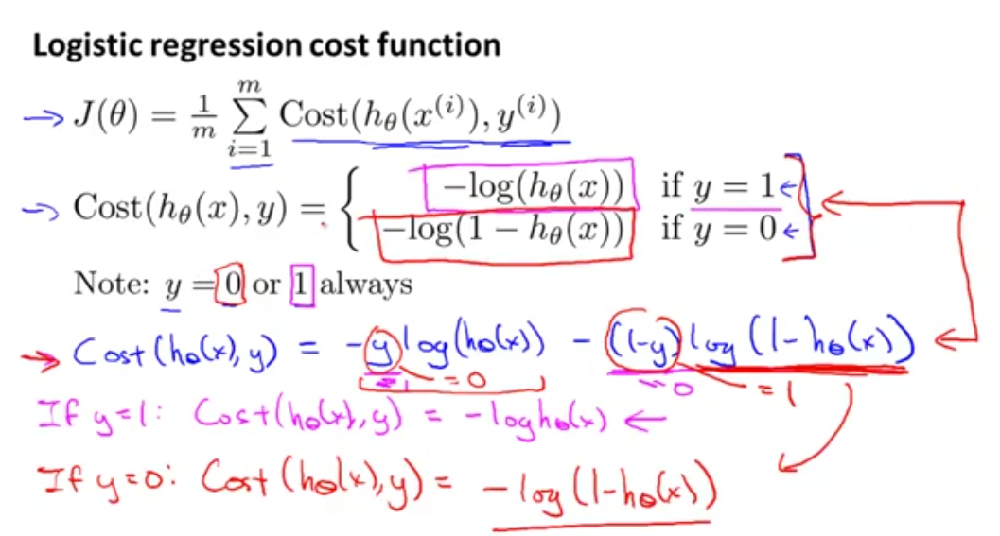

# Regularized Linear Models

# Ridge Regression

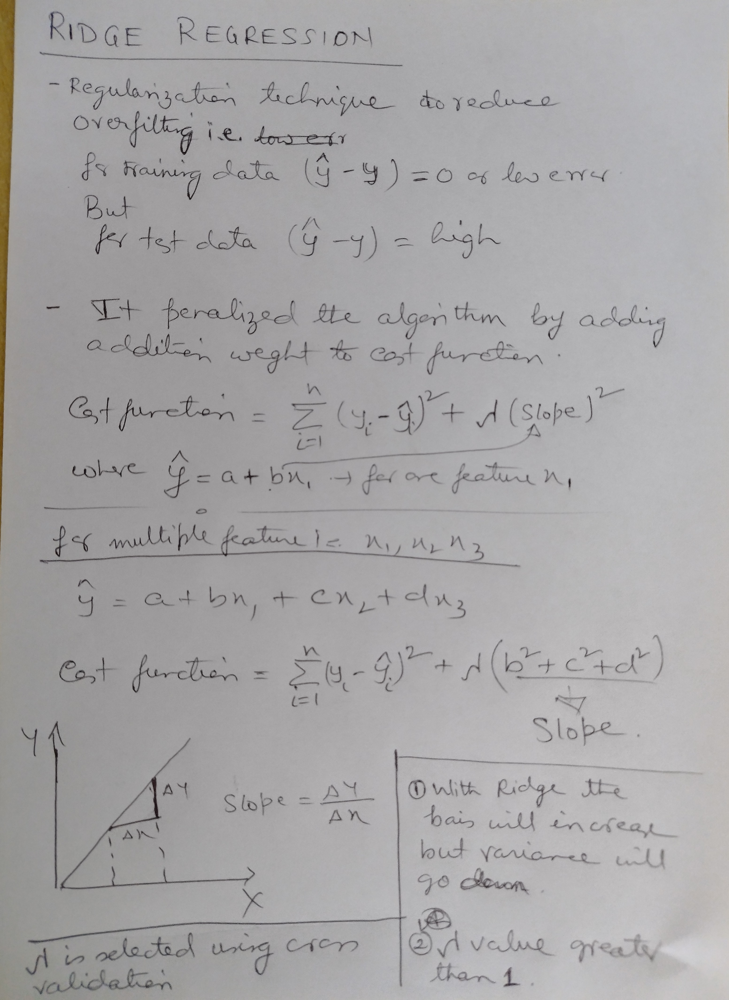

In [156]:
from IPython.display import HTML
video_path = 'Tutorial 27- Ridge and Lasso Regression Indepth Intuition- Data Science.mp4'

HTML("""
<video width="840" height="460" controls="">
<source src="{0}">
</video>
""".format(video_path))

Saving figure ridge_regression_plot


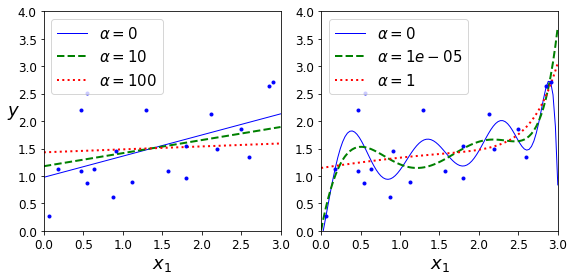

In [162]:
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler

def plot_model(model_class, polynomial, alphas, **model_kargs):
    for alpha, style in zip(alphas, ("b-", "g--", "r:")):
        model = model_class(alpha, **model_kargs) if alpha > 0 else LinearRegression()
        if polynomial:
            model = Pipeline([
                    ("poly_features", PolynomialFeatures(degree=10, include_bias=False)),
                    ("std_scaler", StandardScaler()),
                    ("regul_reg", model),
                ])
        model.fit(X, y)
        y_new_regul = model.predict(X_new)
        lw = 2 if alpha > 0 else 1
        plt.plot(X_new, y_new_regul, style, linewidth=lw, label=r"$\alpha = {}$".format(alpha))
    plt.plot(X, y, "b.", linewidth=3)
    plt.legend(loc="upper left", fontsize=15)
    plt.xlabel("$x_1$", fontsize=18)
    plt.axis([0, 3, 0, 4])

plt.figure(figsize=(8,4))
plt.subplot(121)
plot_model(Ridge, polynomial=False, alphas=(0, 10, 100), random_state=42)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.subplot(122)
plot_model(Ridge, polynomial=True, alphas=(0, 10**-5, 1), random_state=42)

save_fig("ridge_regression_plot")
plt.show()

In [158]:
np.random.seed(42)
m = 20
X = 3 * np.random.rand(m, 1)
y = 1 + 0.5 * X + np.random.randn(m, 1) / 1.5
X_new = np.linspace(0, 3, 100).reshape(100, 1)

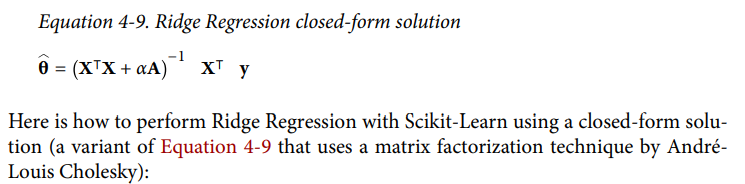

In [159]:
from sklearn.linear_model import Ridge
ridge_reg = Ridge(alpha=1, solver="cholesky", random_state=42)
ridge_reg.fit(X, y)


Ridge(alpha=1, random_state=42, solver='cholesky')

In [160]:
# predicting for x = 1.5 
ridge_reg.predict([[1.5]])

array([[1.55071465]])

# And using Stochastic Gradient Descent:

In [164]:
# predicting for x = 1.5 
sgd_reg = SGDRegressor(penalty="l2", max_iter=1000, tol=1e-3, random_state=42)
sgd_reg.fit(X, y.ravel())
sgd_reg.predict([[1.5]])

array([1.47012588])

# Lasso Regression 

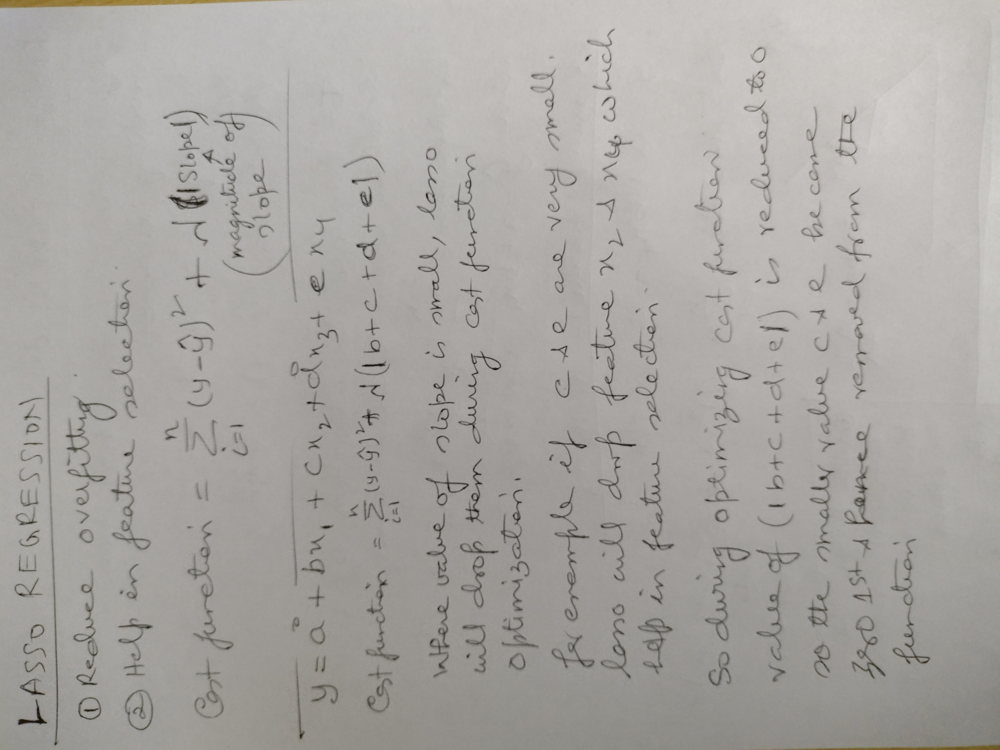

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.802867703827432, tolerance: 0.0009294783355207351
  model = cd_fast.enet_coordinate_descent(


Saving figure lasso_regression_plot


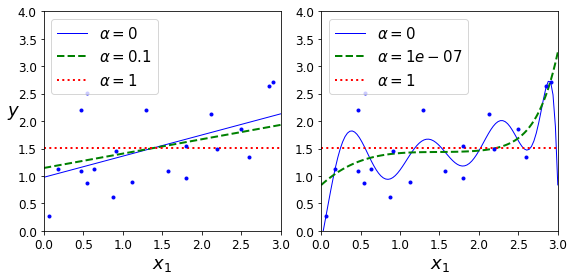

In [165]:
from sklearn.linear_model import Lasso

plt.figure(figsize=(8,4))
plt.subplot(121)
plot_model(Lasso, polynomial=False, alphas=(0, 0.1, 1), random_state=42)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.subplot(122)
plot_model(Lasso, polynomial=True, alphas=(0, 10**-7, 1), random_state=42)

save_fig("lasso_regression_plot")
plt.show()

In [167]:
# predicting for x = 1.5 
from sklearn.linear_model import Lasso
lasso_reg = Lasso(alpha=0.1)
lasso_reg.fit(X, y)
lasso_reg.predict([[1.5]])

array([1.53788174])

# Early Stopping 

In [168]:
np.random.seed(42)
m = 100
X = 6 * np.random.rand(m, 1) - 3
y = 2 + X + 0.5 * X**2 + np.random.randn(m, 1)

X_train, X_val, y_train, y_val = train_test_split(X[:50], y[:50].ravel(), test_size=0.5, random_state=10)

In [169]:
from copy import deepcopy

poly_scaler = Pipeline([
        ("poly_features", PolynomialFeatures(degree=90, include_bias=False)),
        ("std_scaler", StandardScaler())
    ])

X_train_poly_scaled = poly_scaler.fit_transform(X_train)
X_val_poly_scaled = poly_scaler.transform(X_val)

sgd_reg = SGDRegressor(max_iter=1, tol=-np.infty, warm_start=True,
                       penalty=None, learning_rate="constant", eta0=0.0005, random_state=42)

minimum_val_error = float("inf")
best_epoch = None
best_model = None
for epoch in range(1000):
    sgd_reg.fit(X_train_poly_scaled, y_train)  # continues where it left off
    y_val_predict = sgd_reg.predict(X_val_poly_scaled)
    val_error = mean_squared_error(y_val, y_val_predict)
    if val_error < minimum_val_error:
        minimum_val_error = val_error
        best_epoch = epoch
        best_model = deepcopy(sgd_reg)

Create the graph:

Saving figure early_stopping_plot


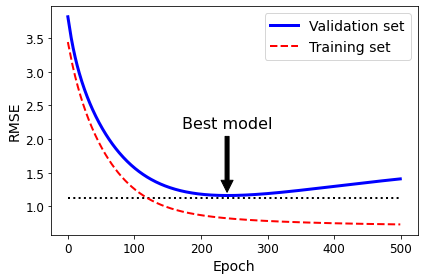

In [170]:
sgd_reg = SGDRegressor(max_iter=1, tol=-np.infty, warm_start=True,
                       penalty=None, learning_rate="constant", eta0=0.0005, random_state=42)

n_epochs = 500
train_errors, val_errors = [], []
for epoch in range(n_epochs):
    sgd_reg.fit(X_train_poly_scaled, y_train)
    y_train_predict = sgd_reg.predict(X_train_poly_scaled)
    y_val_predict = sgd_reg.predict(X_val_poly_scaled)
    train_errors.append(mean_squared_error(y_train, y_train_predict))
    val_errors.append(mean_squared_error(y_val, y_val_predict))

best_epoch = np.argmin(val_errors)
best_val_rmse = np.sqrt(val_errors[best_epoch])

plt.annotate('Best model',
             xy=(best_epoch, best_val_rmse),
             xytext=(best_epoch, best_val_rmse + 1),
             ha="center",
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=16,
            )

best_val_rmse -= 0.03  # just to make the graph look better
plt.plot([0, n_epochs], [best_val_rmse, best_val_rmse], "k:", linewidth=2)
plt.plot(np.sqrt(val_errors), "b-", linewidth=3, label="Validation set")
plt.plot(np.sqrt(train_errors), "r--", linewidth=2, label="Training set")
plt.legend(loc="upper right", fontsize=14)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("RMSE", fontsize=14)
save_fig("early_stopping_plot")
plt.show()

With Stochastic and Mini-batch Gradient Descent, the curves are
not so smooth, and it may be hard to know whether you have
reached the minimum or not. One solution is to stop only after the
validation error has been above the minimum for some time (when
you are confident that the model will not do any better), then roll
back the model parameters to the point where the validation error
was at a minimum.


In [171]:
best_epoch, best_model

(239,
 SGDRegressor(eta0=0.0005, learning_rate='constant', max_iter=1, penalty=None,
              random_state=42, tol=-inf, warm_start=True))

# Logistic regression

In [172]:
from IPython.display import HTML
video_path = 'A Short Introduction to Entropy, Cross-Entropy and KL-Divergence.mp4'

HTML("""
<video width="840" height="460" controls="">
<source src="{0}">
</video>
""".format(video_path))